En este ejemplo se utilizan 15 epocas de entrenamiento utilizando masksembles.

# Import the project

In [1]:
from detect import *

from torchsummary import summary

import time

from utils.utils import non_max_suppression

# Funciones para graficar

In [2]:
def _draw_and_save_output_images(img_detections, imgs, img_size, output_path, classes):
    """Draws detections in output images and stores them.

    :param img_detections: List of detections
    :type img_detections: [Tensor]
    :param imgs: List of paths to image files
    :type imgs: [str]
    :param img_size: Size of each image dimension for yolo
    :type img_size: int
    :param output_path: Path of output directory
    :type output_path: str
    :param classes: List of class names
    :type classes: [str]
    """

    # Iterate through images and save plot of detections
    for (image_path, detections) in zip(imgs, img_detections):
        print(f"Image {image_path}:")
        _draw_and_save_output_image(
            image_path, detections, img_size, output_path, classes)


def _draw_and_save_output_image(image_path, detections, img_size, output_path, classes):
    """Draws detections in output image and stores this.

    :param image_path: Path to input image
    :type image_path: str
    :param detections: List of detections on image
    :type detections: [Tensor]
    :param img_size: Size of each image dimension for yolo
    :type img_size: int
    :param output_path: Path of output directory
    :type output_path: str
    :param classes: List of class names
    :type classes: [str]
    """
    # Create plot
    img = np.array(Image.open(image_path))
    plt.figure()
    fig, ax = plt.subplots(1)
    ax.imshow(img)
    # Rescale boxes to original image
    detections = rescale_boxes(detections, img_size, img.shape[:2])
    unique_labels = detections[:, -1].cpu().unique()
    n_cls_preds = len(unique_labels)
    # Bounding-box colors
    cmap = plt.get_cmap("tab20b")
    colors = [cmap(i) for i in np.linspace(0, 1, n_cls_preds)]
    bbox_colors = random.sample(colors, n_cls_preds)
    for x1, y1, x2, y2, conf, cls_pred in detections:

        print(f"\t+ Label: {classes[int(cls_pred)]} | Confidence: {conf.item():0.4f}")

        box_w = x2 - x1
        box_h = y2 - y1

        color = bbox_colors[int(np.where(unique_labels == int(cls_pred))[0])]
        # Create a Rectangle patch
        bbox = patches.Rectangle((x1, y1), box_w, box_h, linewidth=2, edgecolor=color, facecolor="none")
        # Add the bbox to the plot
        ax.add_patch(bbox)
        # Add label
        plt.text(
            x1,
            y1,
            s=f"{classes[int(cls_pred)]}: {conf:.2f}",
            color="white",
            verticalalignment="top",
            bbox={"color": color, "pad": 0})

    # Save generated image with detections
    plt.axis("off")
    plt.gca().xaxis.set_major_locator(NullLocator())
    plt.gca().yaxis.set_major_locator(NullLocator())
    filename = os.path.basename(image_path).split(".")[0]
    output_path = os.path.join(output_path, f"{filename}.png")
    plt.savefig(output_path, bbox_inches="tight", pad_inches=0.0)
    plt.close()


def _create_data_loader(img_path, batch_size, img_size, n_cpu):
    """Creates a DataLoader for inferencing.

    :param img_path: Path to file containing all paths to validation images.
    :type img_path: str
    :param batch_size: Size of each image batch
    :type batch_size: int
    :param img_size: Size of each image dimension for yolo
    :type img_size: int
    :param n_cpu: Number of cpu threads to use during batch generation
    :type n_cpu: int
    :return: Returns DataLoader
    :rtype: DataLoader
    """
    dataset = ImageFolder(
        img_path,
        transform=transforms.Compose([DEFAULT_TRANSFORMS, Resize(img_size)]))
    dataloader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=n_cpu,
        pin_memory=True)
    return dataloader

# Argumentos del modelo

In [3]:
parser = argparse.ArgumentParser(description="Detect objects on images.")
parser.add_argument("-m", "--model", type=str, default="../config/yolov3.cfg", help="Path to model definition file (.cfg)")
parser.add_argument("-w", "--weights", type=str, default="../weights/yolov3.weights", help="Path to weights or checkpoint file (.weights or .pth)")
parser.add_argument("-i", "--images", type=str, default="../data/samples", help="Path to directory with images to inference")
parser.add_argument("-c", "--classes", type=str, default="../data/coco.names", help="Path to classes label file (.names)")
parser.add_argument("-o", "--output", type=str, default="../output_yolov3", help="Path to output directory")
parser.add_argument("-b", "--batch_size", type=int, default=1, help="Size of each image batch")
parser.add_argument("--img_size", type=int, default=416, help="Size of each image dimension for yolo")
parser.add_argument("--n_cpu", type=int, default=8, help="Number of cpu threads to use during batch generation")
parser.add_argument("--conf_thres", type=float, default=0.5, help="Object confidence threshold")
parser.add_argument("--nms_thres", type=float, default=0.4, help="IOU threshold for non-maximum suppression")
args, unknown = parser.parse_known_args()
print(f"Command line arguments: {args}")

Command line arguments: Namespace(model='../config/yolov3.cfg', weights='../weights/yolov3.weights', images='../data/samples', classes='../data/coco.names', output='../output_yolov3', batch_size=1, img_size=416, n_cpu=8, conf_thres=0.5, nms_thres=0.4)


In [4]:
model_path      = '../config/yolomask.cfg'
weights_path    = '../checkpoints/yolomask_ckpt_15.pth'
img_path        = args.images
classes         = load_classes(args.classes)
output_path     = "../output_mask"
batch_size      = args.batch_size
img_size        = args.img_size
n_cpu           = args.n_cpu
conf_thres      = args.conf_thres
nms_thres       = args.nms_thres

# Model summary

In [5]:
dataloader = _create_data_loader(img_path, batch_size, img_size, n_cpu)
model = load_model(model_path, weights_path)

# Aplicando non max supresion

Se creo un funcion con todo el pipeline para obtener las imagenes con las 4 mascaras

In [6]:
from torch.autograd import Variable

def display_box(model, dataloader, img_path):
    model.eval()  # Set model to evaluation mode

    Tensor = torch.cuda.FloatTensor if torch.cuda.is_available() else torch.FloatTensor

    img_detections = []  # Stores detections for each image index
    imgs = []  # Stores image paths

    for (img_paths, input_imgs) in tqdm.tqdm(dataloader, desc="Detecting"):
        # Configure input
        input_imgs = Variable(input_imgs.type(Tensor))

        print('\n\n\n' + '-'*30 + img_paths[0] + '-'*30)

        # Get detections
        with torch.no_grad():

            inputs = torch.tile(input_imgs, [4, 1, 1, 1]) 
            inputs = inputs.to('cuda')
            detections = model(inputs)
            boxes = non_max_suppression(detections, 0.1, nms_thres)
            
            img = np.array(Image.open(img_paths[0]))
            for detect in boxes:
                plt.figure()
                fig, ax = plt.subplots(1)
                ax.imshow(img)
                # Rescale boxes to original image
                detect = rescale_boxes(detect, img_size, img.shape[:2])
                unique_labels = detect[:, -1].cpu().unique()
                n_cls_preds = len(unique_labels)
                # Bounding-box colors
                cmap = plt.get_cmap("tab20b")
                colors = [cmap(i) for i in np.linspace(0, 1, n_cls_preds)]
                bbox_colors = random.sample(colors, n_cls_preds)
                for x1, y1, x2, y2, conf, cls_pred in detect:

                    print(f"\t+ Label: {classes[int(cls_pred)]} | Confidence: {conf.item():0.4f}")

                    box_w = x2 - x1
                    box_h = y2 - y1

                    color = bbox_colors[int(np.where(unique_labels == int(cls_pred))[0])]
                    # Create a Rectangle patch
                    bbox = patches.Rectangle((x1, y1), box_w, box_h, linewidth=2, edgecolor=color, facecolor="none")
                    # Add the bbox to the plot
                    ax.add_patch(bbox)
                    # Add label
                    plt.text(
                        x1,
                        y1,
                        s=f"{classes[int(cls_pred)]}: {conf:.2f}",
                        color="white",
                        verticalalignment="top",
                        bbox={"color": color, "pad": 0})

                # Save generated image with detections
                plt.axis("off")
                plt.gca().xaxis.set_major_locator(NullLocator())
                plt.gca().yaxis.set_major_locator(NullLocator())
                plt.show()



Detecting:   0%|          | 0/12 [00:00<?, ?it/s]




------------------------------../data/samples\COCo girl.jpg------------------------------
	+ Label: person | Confidence: 0.4267
	+ Label: car | Confidence: 0.1803


<Figure size 640x480 with 0 Axes>

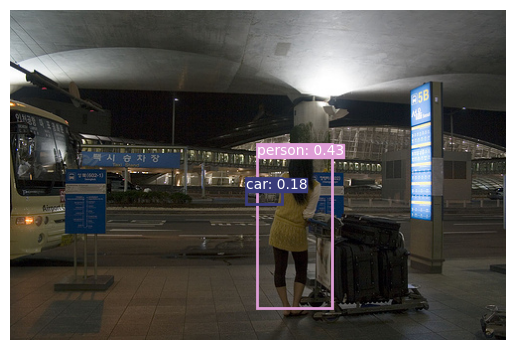

	+ Label: person | Confidence: 0.4887


<Figure size 640x480 with 0 Axes>

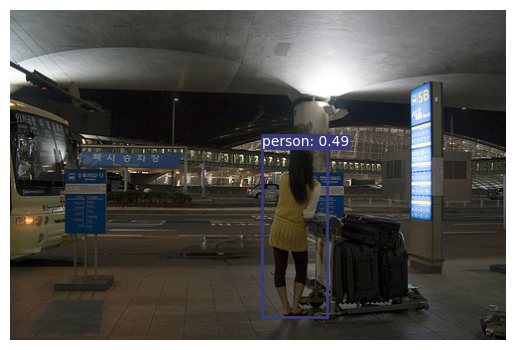

	+ Label: person | Confidence: 0.3997
	+ Label: car | Confidence: 0.1646


<Figure size 640x480 with 0 Axes>

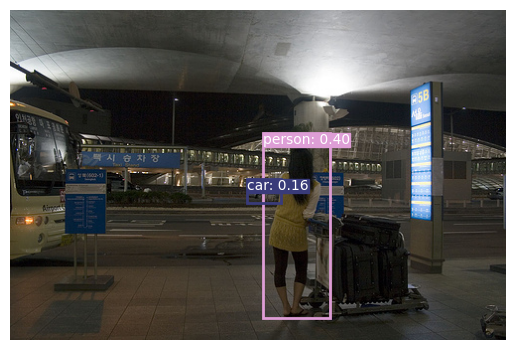

	+ Label: person | Confidence: 0.4770


<Figure size 640x480 with 0 Axes>

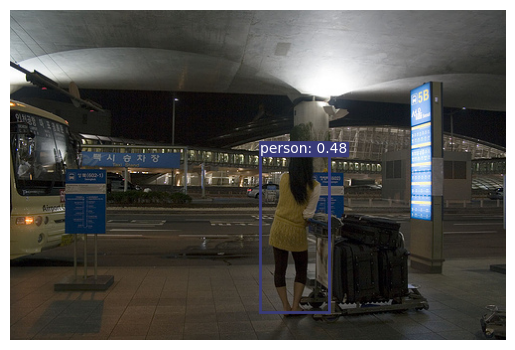

Detecting:   8%|▊         | 1/12 [00:04<00:46,  4.27s/it]




------------------------------../data/samples\dog.jpg------------------------------
	+ Label: car | Confidence: 0.4726
	+ Label: person | Confidence: 0.1461
	+ Label: car | Confidence: 0.1194


<Figure size 640x480 with 0 Axes>

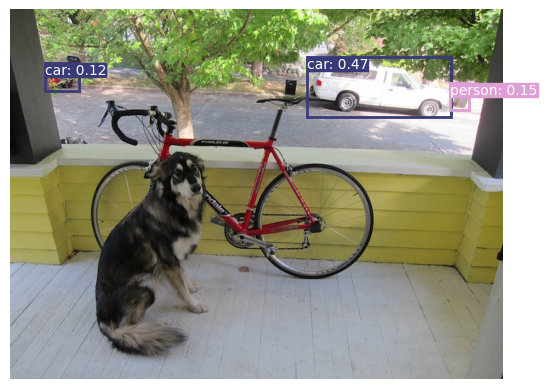

	+ Label: car | Confidence: 0.3861
	+ Label: person | Confidence: 0.1446


<Figure size 640x480 with 0 Axes>

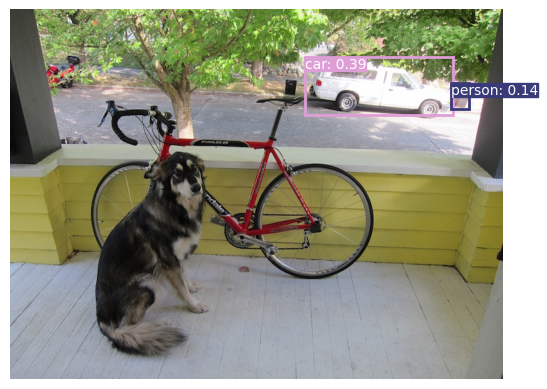

	+ Label: car | Confidence: 0.4045
	+ Label: car | Confidence: 0.1918
	+ Label: person | Confidence: 0.1641


<Figure size 640x480 with 0 Axes>

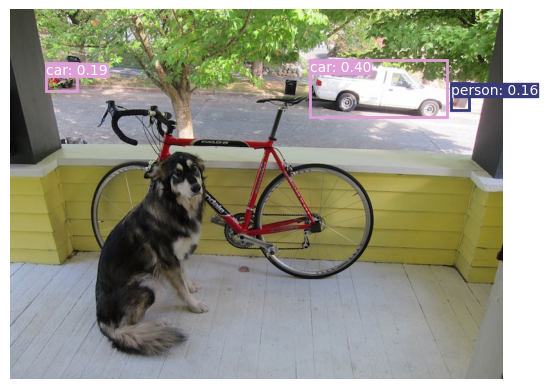

	+ Label: car | Confidence: 0.3253
	+ Label: person | Confidence: 0.1302


<Figure size 640x480 with 0 Axes>

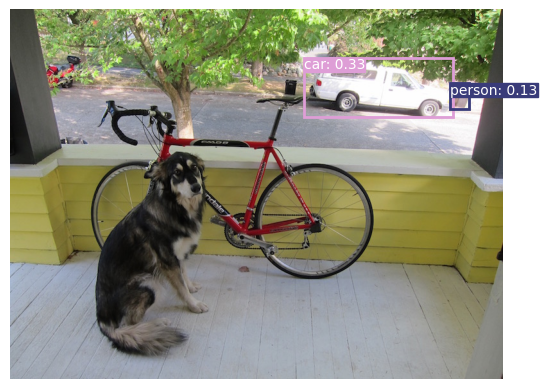

Detecting:  17%|█▋        | 2/12 [00:04<00:20,  2.08s/it]




------------------------------../data/samples\eagle.jpg------------------------------


<Figure size 640x480 with 0 Axes>

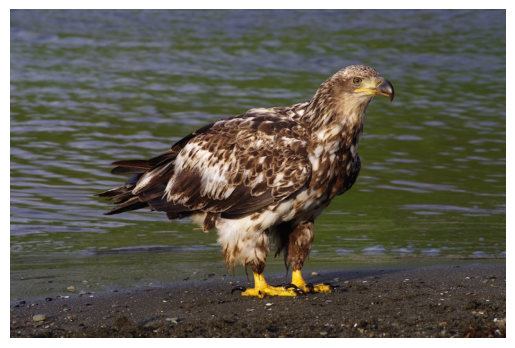

<Figure size 640x480 with 0 Axes>

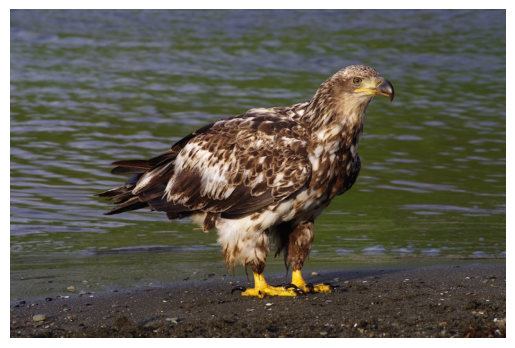

<Figure size 640x480 with 0 Axes>

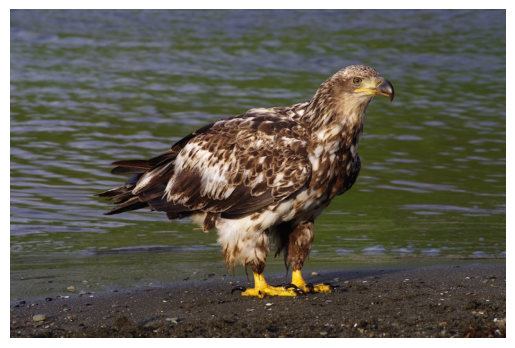

<Figure size 640x480 with 0 Axes>

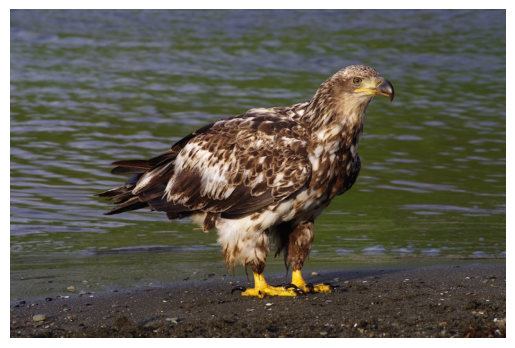

Detecting:  25%|██▌       | 3/12 [00:05<00:12,  1.37s/it]




------------------------------../data/samples\field.jpg------------------------------
	+ Label: person | Confidence: 0.6258


<Figure size 640x480 with 0 Axes>

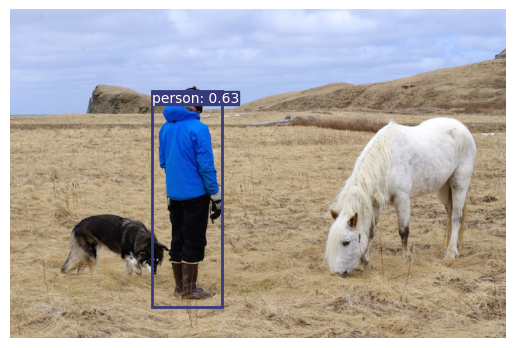

	+ Label: person | Confidence: 0.5823


<Figure size 640x480 with 0 Axes>

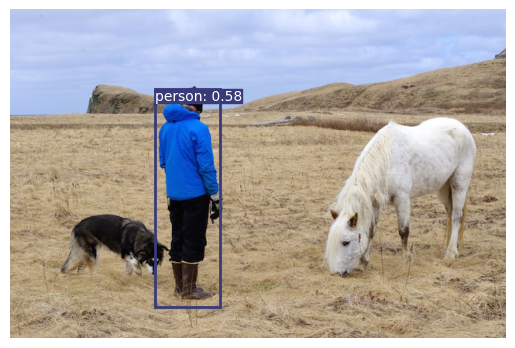

	+ Label: person | Confidence: 0.6320


<Figure size 640x480 with 0 Axes>

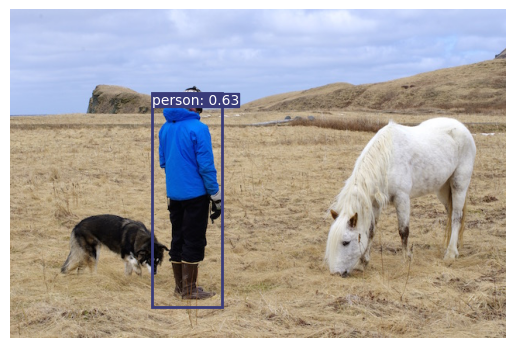

	+ Label: person | Confidence: 0.5359


<Figure size 640x480 with 0 Axes>

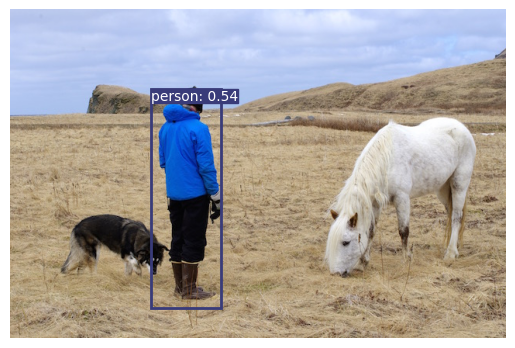

Detecting:  33%|███▎      | 4/12 [00:05<00:08,  1.02s/it]




------------------------------../data/samples\giraffe.jpg------------------------------


<Figure size 640x480 with 0 Axes>

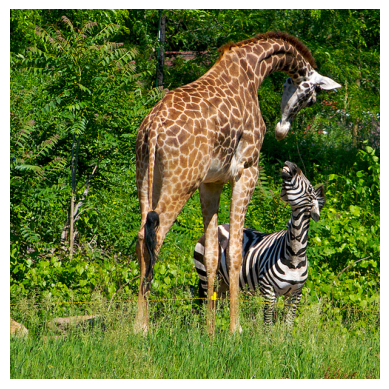

<Figure size 640x480 with 0 Axes>

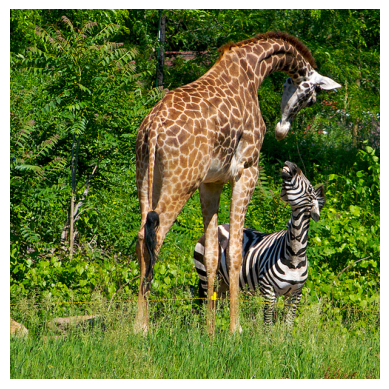

<Figure size 640x480 with 0 Axes>

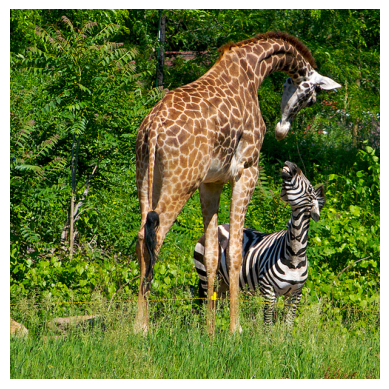

<Figure size 640x480 with 0 Axes>

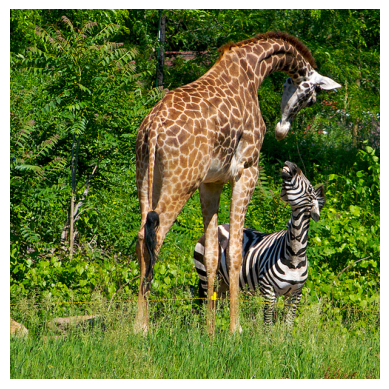

Detecting:  42%|████▏     | 5/12 [00:06<00:05,  1.26it/s]




------------------------------../data/samples\herd_of_horses.jpg------------------------------
	+ Label: sheep | Confidence: 0.1078


<Figure size 640x480 with 0 Axes>

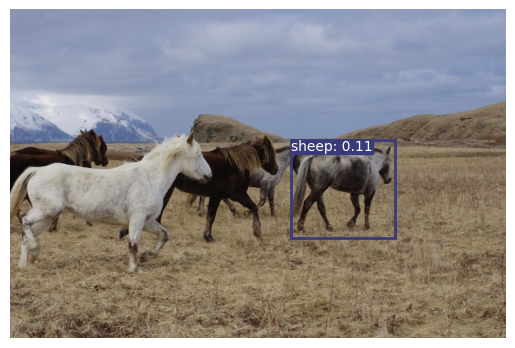

	+ Label: car | Confidence: 0.1040


<Figure size 640x480 with 0 Axes>

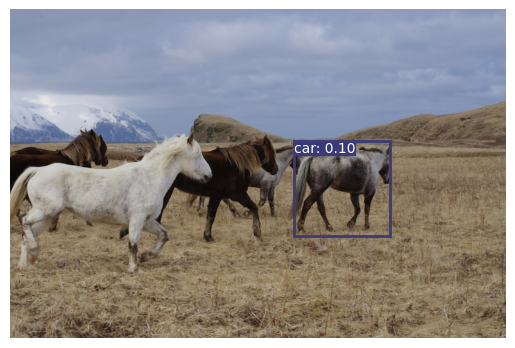

<Figure size 640x480 with 0 Axes>

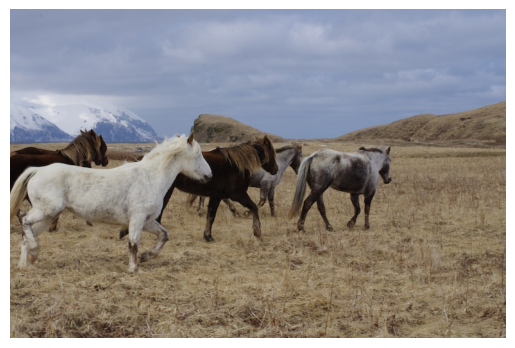

<Figure size 640x480 with 0 Axes>

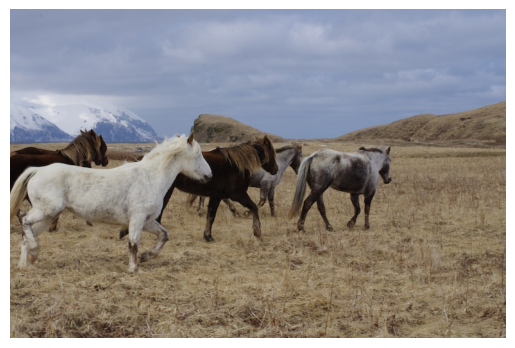

Detecting:  50%|█████     | 6/12 [00:06<00:04,  1.42it/s]




------------------------------../data/samples\messi.jpg------------------------------
	+ Label: person | Confidence: 0.6773
	+ Label: person | Confidence: 0.4499
	+ Label: person | Confidence: 0.3645


<Figure size 640x480 with 0 Axes>

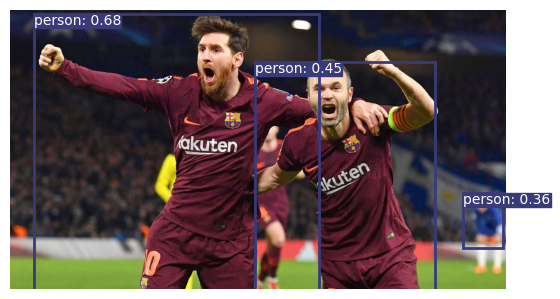

	+ Label: person | Confidence: 0.6775
	+ Label: person | Confidence: 0.4716
	+ Label: person | Confidence: 0.4104
	+ Label: person | Confidence: 0.1016


<Figure size 640x480 with 0 Axes>

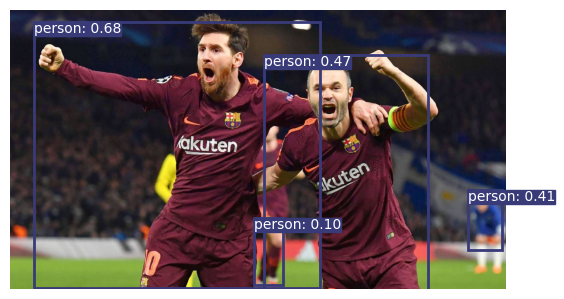

	+ Label: person | Confidence: 0.7498
	+ Label: person | Confidence: 0.4870
	+ Label: person | Confidence: 0.4082
	+ Label: person | Confidence: 0.1375


<Figure size 640x480 with 0 Axes>

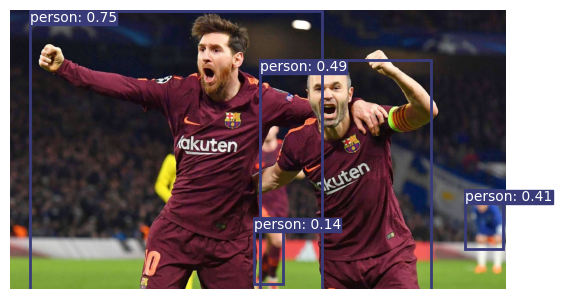

	+ Label: person | Confidence: 0.5738
	+ Label: person | Confidence: 0.3926
	+ Label: person | Confidence: 0.3873


<Figure size 640x480 with 0 Axes>

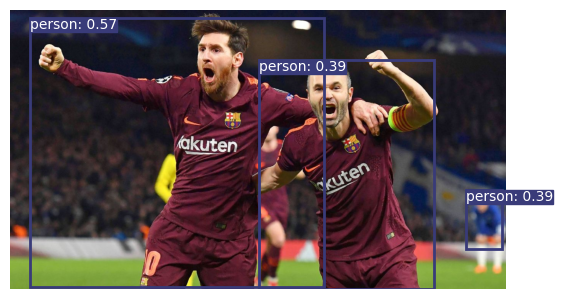

Detecting:  58%|█████▊    | 7/12 [00:07<00:03,  1.43it/s]




------------------------------../data/samples\perritos.jpeg------------------------------


<Figure size 640x480 with 0 Axes>

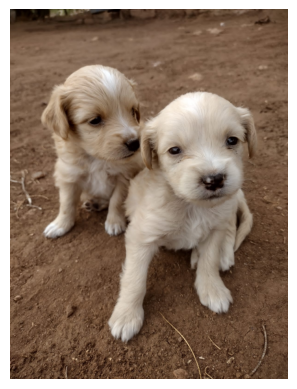

<Figure size 640x480 with 0 Axes>

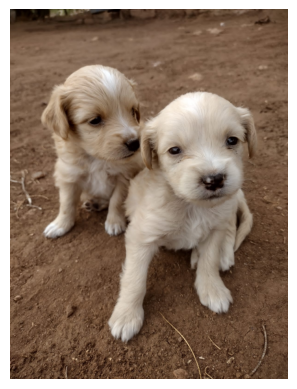

<Figure size 640x480 with 0 Axes>

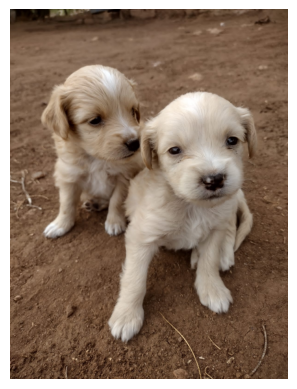

<Figure size 640x480 with 0 Axes>

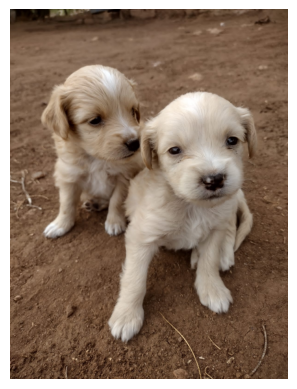

Detecting:  67%|██████▋   | 8/12 [00:08<00:02,  1.37it/s]




------------------------------../data/samples\perro.jpeg------------------------------
	+ Label: person | Confidence: 0.5045
	+ Label: person | Confidence: 0.4178
	+ Label: person | Confidence: 0.2772
	+ Label: person | Confidence: 0.1091


<Figure size 640x480 with 0 Axes>

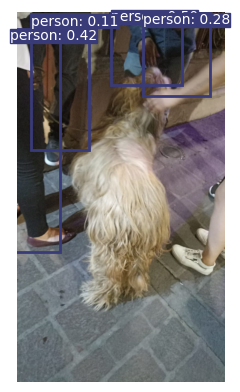

	+ Label: person | Confidence: 0.4258
	+ Label: person | Confidence: 0.4150
	+ Label: person | Confidence: 0.2036


<Figure size 640x480 with 0 Axes>

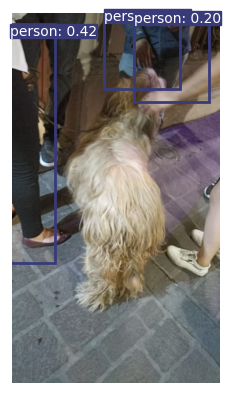

	+ Label: person | Confidence: 0.4447
	+ Label: person | Confidence: 0.4171
	+ Label: person | Confidence: 0.1693
	+ Label: person | Confidence: 0.1186
	+ Label: person | Confidence: 0.1090


<Figure size 640x480 with 0 Axes>

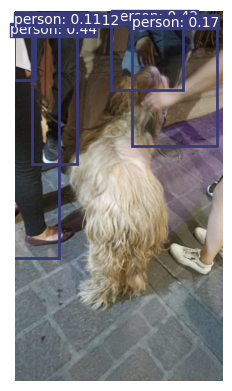

	+ Label: person | Confidence: 0.4473
	+ Label: person | Confidence: 0.3779
	+ Label: person | Confidence: 0.2228


<Figure size 640x480 with 0 Axes>

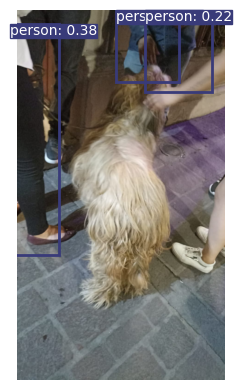

Detecting:  75%|███████▌  | 9/12 [00:08<00:02,  1.40it/s]




------------------------------../data/samples\person.jpg------------------------------
	+ Label: person | Confidence: 0.3450


<Figure size 640x480 with 0 Axes>

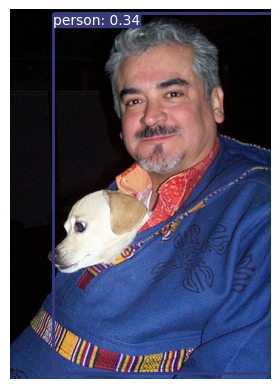

	+ Label: person | Confidence: 0.5475


<Figure size 640x480 with 0 Axes>

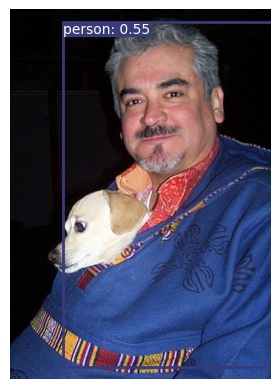

	+ Label: person | Confidence: 0.4862


<Figure size 640x480 with 0 Axes>

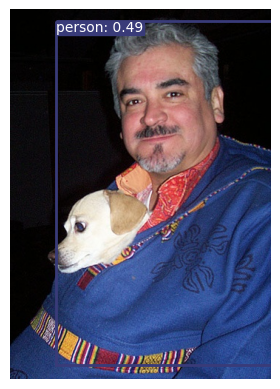

	+ Label: person | Confidence: 0.4110


<Figure size 640x480 with 0 Axes>

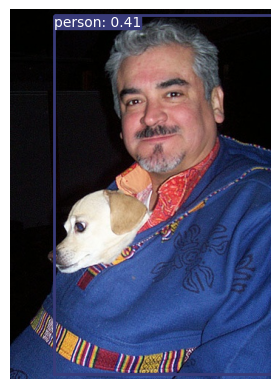

Detecting:  83%|████████▎ | 10/12 [00:09<00:01,  1.47it/s]




------------------------------../data/samples\room.jpg------------------------------
	+ Label: person | Confidence: 0.1242


<Figure size 640x480 with 0 Axes>

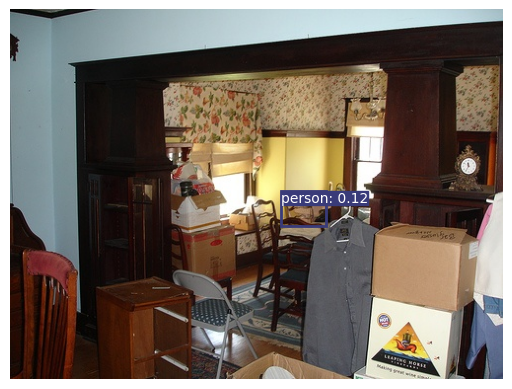

	+ Label: person | Confidence: 0.1045


<Figure size 640x480 with 0 Axes>

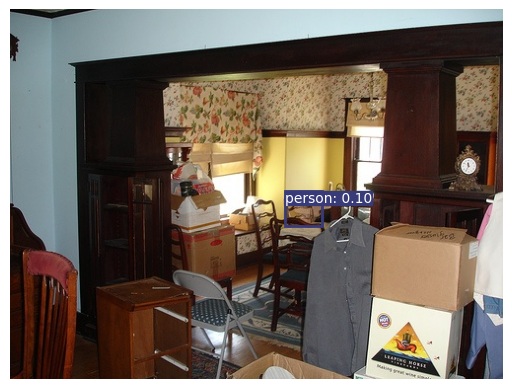

	+ Label: person | Confidence: 0.1434
	+ Label: person | Confidence: 0.1132


<Figure size 640x480 with 0 Axes>

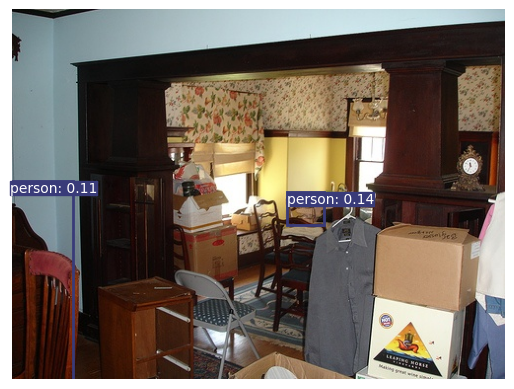

<Figure size 640x480 with 0 Axes>

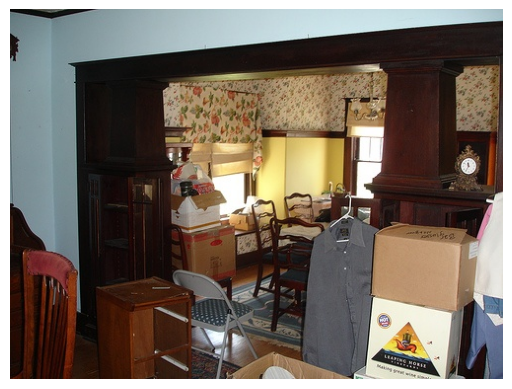

Detecting:  92%|█████████▏| 11/12 [00:10<00:00,  1.57it/s]




------------------------------../data/samples\street.jpg------------------------------
	+ Label: car | Confidence: 0.5841
	+ Label: car | Confidence: 0.5467
	+ Label: car | Confidence: 0.4687
	+ Label: car | Confidence: 0.3804
	+ Label: car | Confidence: 0.2522
	+ Label: car | Confidence: 0.2152
	+ Label: car | Confidence: 0.2008
	+ Label: car | Confidence: 0.1858
	+ Label: car | Confidence: 0.1448
	+ Label: car | Confidence: 0.1228
	+ Label: car | Confidence: 0.1093


<Figure size 640x480 with 0 Axes>

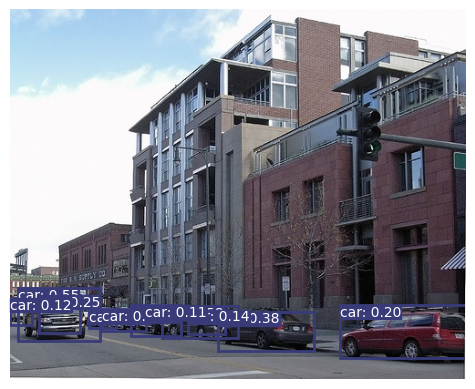

	+ Label: car | Confidence: 0.4957
	+ Label: car | Confidence: 0.4629
	+ Label: car | Confidence: 0.3929
	+ Label: car | Confidence: 0.3294
	+ Label: car | Confidence: 0.2506
	+ Label: car | Confidence: 0.2098
	+ Label: car | Confidence: 0.1308


<Figure size 640x480 with 0 Axes>

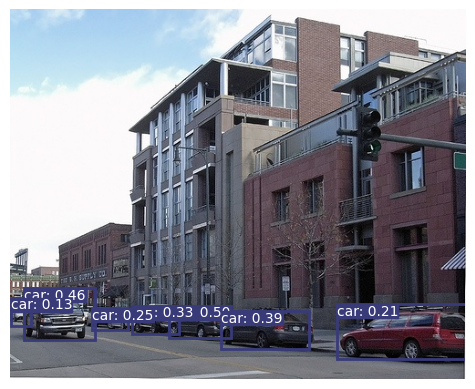

	+ Label: car | Confidence: 0.5249
	+ Label: car | Confidence: 0.4686
	+ Label: car | Confidence: 0.3652
	+ Label: car | Confidence: 0.3639
	+ Label: car | Confidence: 0.2360
	+ Label: car | Confidence: 0.2283
	+ Label: car | Confidence: 0.1605
	+ Label: car | Confidence: 0.1150
	+ Label: car | Confidence: 0.1069


<Figure size 640x480 with 0 Axes>

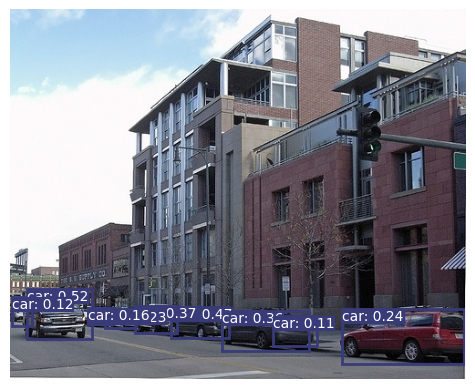

	+ Label: car | Confidence: 0.4631
	+ Label: car | Confidence: 0.3729
	+ Label: car | Confidence: 0.3653
	+ Label: car | Confidence: 0.3623
	+ Label: car | Confidence: 0.1896
	+ Label: car | Confidence: 0.1873
	+ Label: car | Confidence: 0.1801


<Figure size 640x480 with 0 Axes>

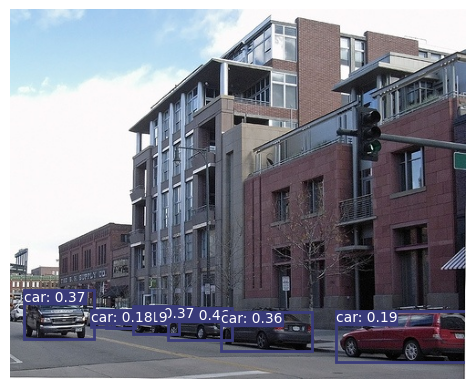

Detecting: 100%|██████████| 12/12 [00:11<00:00,  1.06it/s]


In [7]:
display_box(model, dataloader, '')